<a href="https://colab.research.google.com/github/theburaq/Dog-Breed-Classification-Project-ML/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

In this project we're going to be using machine learning to help us identify different breeds of dogs.

To do this, we'll be using data from the Kaggle dog breed identification competition. https://www.kaggle.com/c/dog-breed-identification/overview
It consists of a collection of 10,000+ labelled images of 120 different dog breeds.

This kind of problem is called **multi-class image classification**. It's multi-class because we're trying to classify mutliple different breeds of dog. If we were only trying to classify dogs versus cats, it would be called binary classification (one thing versus another).

Multi-class image classification is an important problem because it's the same kind of technology Tesla uses in their self-driving cars or Airbnb uses in atuomatically adding information to their listings.

Since the most important step in a deep learng problem is getting the data ready (turning it into numbers), that's what we're going to start with.

We're going to go through the following TensorFlow/Deep Learning workflow:

1. Get data ready (download from Kaggle, store, import).
2. Prepare the data (preprocessing, the 3 sets, X & y).
3. Choose and fit/train a model (TensorFlow Hub, tf.keras.applications, TensorBoard, EarlyStopping).
4. Evaluating a model (making predictions, comparing them with the ground truth labels).
5. Improve the model through experimentation (start with 1000 images, make sure it works, increase the number of images).
6. Save, sharing and reloading your model (once you're happy with the results).

For preprocessing our data, we're going to use **TensorFlow 2.x**. The whole premise here is to get our data into Tensors (arrays of numbers which can be run on GPUs) and then allow a machine learning model to find patterns between them.

For our machine learning model, we're going to be using a pretrained deep learning model from **TensorFlow Hub**.

The process of using a pretrained model and adapting it to your own problem is called **transfer learning**. We do this because rather than train our own model from scratch (could be timely and expensive), we leverage the patterns of another model which has been trained to classify images.



## 1. Problem
Identifying the breed of a dog given an image of a dog.
When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.


## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data


## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview


## 4. Features
Some information about the data:

* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes). If we were only trying to classify dogs versus cats, it would be called binary classification (one thing versus another).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).


In [ ]:
# Unzip the uploaded data into Google Drive by following the code below:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

## Get our Workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
# Import TensorFlow into Colab to convert the data into Tensors
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.15.0


In [ ]:
# Import TensorFlow Hub to pick our model
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :( ")

TF Hub version: 0.16.1
GPU available (YESSSSS!!!!)


The reason why we need a GPU b/c, a GPU is a computer chip which is faster at doing numerical computing. And since ML is all about finding patterns in numbers, so we need a faster computer and our laptop's CPU isnt fast enough to do this.

Running this for the first time in Colab will let us know there's no GPU available. This is because by default Colab runs on a computer located on Google's servers which doesn't have a GPU attached to it.

But we can fix this going to runtime and then changing the runtime type...**(check for the steps mentioned in Daniel's GitHub repos note)**. And after this when we rerun the above cells, it'll show 'GPU available'.

## Getting our data ready (turning into Tensors)

With all ML models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Tensors are very similar to 3-dimensional numpy arrays or matrices.

Let's start by accessing our data and checking out the labels.

### Accessing the data:

In [ ]:
# Lets Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())    # checking the 1st 5 data

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


**Let's find out 'How many images are there of each breed?'**

In [ ]:
# Let's count the values in the 'breed' column
labels_csv["breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

<Axes: xlabel='breed'>

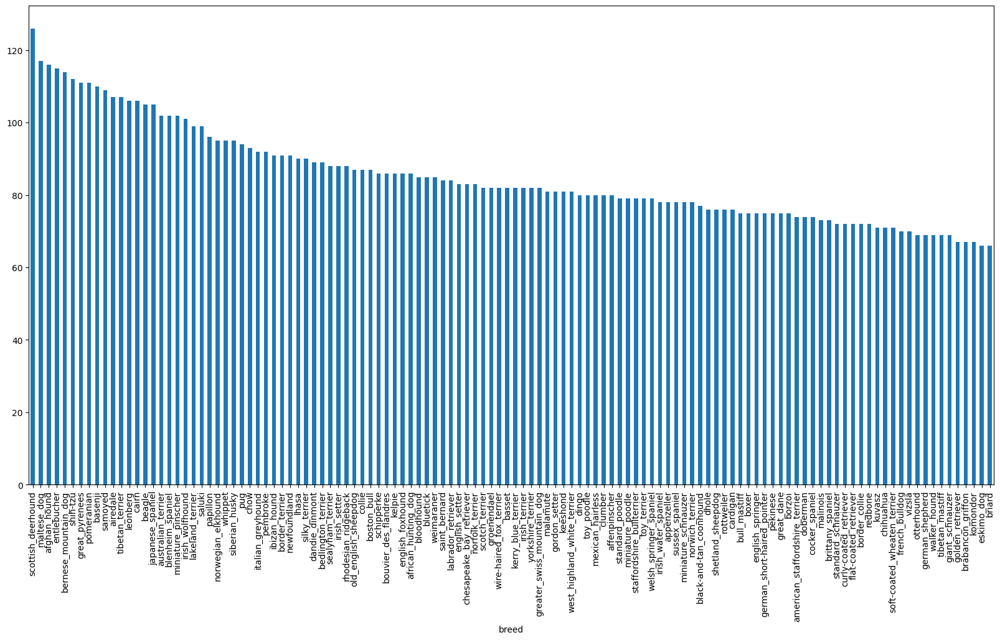

In [ ]:
# Lets visualise it
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

So we can see from above graph the 120 different dog breeds and the number of images that they have.

Now if we draw a line across it, then we can see that on average around 75 or so images are there for each breed.

Let's find that out below:

In [ ]:
# Let's find the average(or median) of the images per breed
labels_csv["breed"].value_counts().median()

82.0

For model training purposes, it is recommended you use about 100 annotations per label.

So in our case, it would be great if you had 100 examples of each image class with at least 10 images per class to get started..

So if you wanted to build your own image classifier, if it's a binary classification, you'd want to be looking at minimum 10 images per class.

More deatils here: https://cloud.google.com/vision/automl/object-detection/docs/prepare#training_vs_evaluation_datasets

### Getting images and their labels:

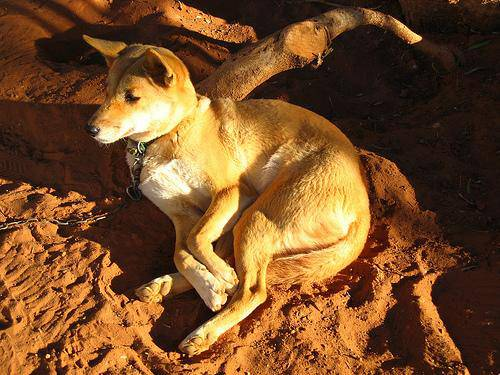

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")  # can insert any id# of any of the breed from the above list

# this will show the picture of the dog breed of the id# meantioned

As it would get tedious to type in each id no. to find teh picture of each breed, so we get a list of all the file names instead.

**Let's get a list of all of our image file pathnames.**

In [ ]:
# Let's check the list again
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


Since we've got the image ID's and their labels in a DataFrame (labels_csv), we'll use it to create:

* A list a filepaths to training images
* An array of all labels
* An array of all unique labels

We'll only create a list of filepaths to images rather than importing them all to begin with. This is because working with filepaths (strings) is much efficient than working with images.

In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the 1st 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

Now we've got a list of all the filenames from the ID column of labels_csv, we can compare it to the number of files in our training data directory to see if they line up.

If they do, great. If not, there may have been an issue when unzipping the data (what we did above), to fix this, you might have to unzip the data again.

In [ ]:
# Check whether no. of filenames matches no. of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames don't match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


Let's do 1 more check. Visualizing directly from a filepath.


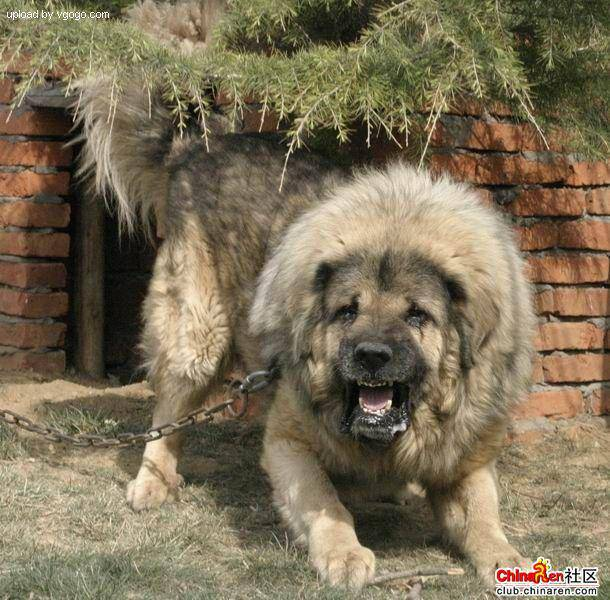

In [ ]:
# Check an image directly from a filepath
Image(filenames[9000])

In [ ]:
# Let's find out the breed of the above image
labels_csv["breed"][9000]

'tibetan_mastiff'

**Since we've now got our training image filepaths in a list, let's prepare our labels.**

We'll take them from labels_csv and turn them into a NumPy array.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

**Now lets do the same thing as our previous projects, check for missing data.**

Checking for missing data in an unstructured data is a bit harder comapred to the structured data.

So We can do it little diffdrently by comparing the no. of labels to the no. of filenames, b/c eventually going to have to do is pair up these labels with these file names like what we've just done above with "tibetan_mastiff".

In [ ]:
# See if the no. of labels matches the no. of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels doresnot match number of ilenames, check data directories!")

Number of labels matches number of filenames!


 Since a ML model can't take strings as input (what `labels` currently is), we'll have to convert our labels to numbers.

To begin with, we'll find all of the unique dog breed names.

Then we'll go through the list of `labels` and compare them to unique breeds and create a list of booleans indicating which one is the real label `(True)` and which ones aren't `(False)`.

In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

The length of "unique_breeds" should be 120, meaning we're working with images of 120 different breeds of dogs.

So let's check its length.

In [ ]:
len(unique_breeds)

120

Now lets use `unique_breeds` to help turn our `labels` array into an **array of booleans**.

In [ ]:
# Example: Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds   # use comparison operator to create boolean array

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

So we can see that 'boston_bull' is `True` at one place only.

That's for one example, let's do the whole thing.

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label ==  unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

 Boolean labels should be 10222 long.

 Let's check.

In [ ]:
len(labels)

10222

In [ ]:
len(boolean_labels)

10222

So this means we've turned every single `label` into a `Boolean label`.

We did the above way **because** as we know that in ML we need to convert our data to numbers before passing it to a machine learning model.

So we can convert these **boolean arrays into numbers**. More specifically, one-hot coded numbers.

In this case, we've transformed a single dog breed name such as `boston_bull` into a one-hot array.

Let's see an example.

In [ ]:
# Example 1: Turning 'boolean array' into 'integers' for 'boston bull' breed
print(labels[0])       # original label
print(np.where(unique_breeds == labels[0]))      # index where label occurs
print(boolean_labels[0].argmax())       # index where label occurs in bollean array
print(boolean_labels[0].astype(int))      # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


So the original label is Boston Bull, and it appears that the 19th index. Which is the same in our Boolean labels zeroth index. So it appears at 19th position above.

So this shows that now every single label in bullying labels is actually in this type of format of 0s & 1s.

So there's a 1 where the actual label occurs.

Now let's try for another one.

In [ ]:
# Example 2:
print(labels[2])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[2].argmax())
print(boolean_labels[2].astype(int))

pekinese
(array([19]),)
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Now we've got our labels in a numeric format and our image filepaths easily accessible (they aren't numeric yet), let's split our data up.

### Creating our own validation set:

Since the dataset from Kaggle doesn't come with a validation set (a split of the data we can test our model on before making final predicitons on the test set), so we'll need to split their training set into your own validation and training sets.

We could use Scikit-Learn's `train_test_split` function or we could simply make manual splits of the data.

For accessibility later, let's save our **filenames** variable to **X** (data) and our **labels** to **y**.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

Since we're working with 10,000+ images, it's a good idea to work with a portion of them to make sure things are working before training on them all.

This is because computing with 10,000+ images could take a fairly long time. And our goal when working through machine learning projects is to reduce the time between experiments.

**Let's start experimenting with ~1000 and increase it as we need.**

In [ ]:
# Set no. of images to use for experimenting

NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

# In deep learning 'hyperparameters' are usually set in capitals
# The above code creates the sldier on the side which if we toggle the no.
# will change on the code too

NUM_IMAGES

1000

Now let's split our data into training and validation sets. We'll use and 80/20 split (80% training data, 20% validation data).

In [ ]:
# Import train_test_split from Scikit-Learn
from sklearn.model_selection import train_test_split

# Split them into training and validation using 'NUM_IMAGES'
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

In [ ]:
# Let's check the lengths of all the data before we proceed so there is no mismatch of shapes
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

So out of 1000 samples, 800 (i.e 80%) samples will be used for training split & 200 (i.e 20%) for validation split.

In [ ]:
# Let's check out the training data (image file paths and labels)
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

Our labels are in numeric format but our images are still just file paths. So we've to convert our images into numbers or at least create a function to do so for us.

### Preprocessing Images (turning images into Tensors):

Since we're using TensorFlow, our data has to be in the form of Tensors.

A Tensor is a way to represent information in numbers.

Because of how TensorFlow stores information (in Tensors), it allows machine learning and deep learning models to be run on GPUs (generally faster at numerical computing).

Some details here: https://www.tensorflow.org/guide/data

**To preprocess our images into Tensors we're going to write a function which does a few things:**

1. Takes an image filename as input.
2. Uses TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpeg file) into Tensors.
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be of shape (224, 224).
6. Return the modified `image`.

Now, this preprocessing function will be specific to images, but the concept remains the same. Whatever data you're working with (audio, images, etc.), you're probably going to have to turn it into some form of tensor.

Before we do, let's see what importing an image looks like.

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])     # '42' is just a filename no.
image.shape

(257, 350, 3)

257 is the height, 350 is the width & 3 is the number of colour channels per pixel, red, green and blue.

In [ ]:
# Let's look at our image & the color combinations
image.max(), image.min()

(255, 0)

Our image here is a numpy array. So each pixel in an image here is some combination of red, green and blue values, and they range from 0 to 255.



array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
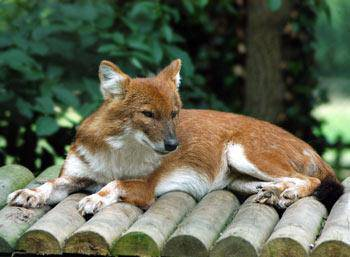

In [ ]:
image


**As tensors are very similar to numpy arrays, so we can easily convert the image into a tensor by using `tf.constant()`.**

In [ ]:
# Turning image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Let's compare by slicing:

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

If we compare both the arrays above, we can see that they both are similar...one is'numpy' while other is'tensor'.

The only difference here is that this tensor is in TensorFlow and now it's able to run on a GPU, so a lot faster compute.

So our GPU will be able to find patterns in the numbers in the latter array a lot faster than what our CPU, which is on my current machine, will be able to find patterns in the former arrays.

**Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.**

Let's look at the steps again:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

More information on loading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [ ]:
# Define image size
IMG_SIZE = 224     # we'll see later what is 224, when we pick out a ML model
                   # that we can use.

# Create a function for preprocessing imgae
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
          # Reads the contents of file-this operation returns a tensor with the
           # entire contents of the input filename. I

  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image,channels=3)
          # the attribute channels indicates the desired no. of colour channels
           # for the decoded image.

  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
          # it converts our values, i.e it scales them instead of being b/w 0
            # and 255, now they are b/w 0 & 1 with the same scale or same shape.
          # This process is called as 'Normalization'.
          # This type of process makes computing on these more efficient.

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


**NOTE:**

*A lot of ML is lining up the size of your inputs or the shape of your inputs,
in our case, images with the model that you're using.*

*Essentially, we're making sure that our images that we feed into a ML model out of this shape so 224 high, 224 wide, because that is what the ML model that we're going to use which trained on images in that same shape.*

*Remember how it's important to feed data in the same format and shape to your ML model as it was trained on when you're trying to make predictions.*

*But we'll see that in practice later on.*

**Though we've got our data ready by turning it into tenses. But we are not yet ready for our next step of the workflow, i.e to pick a model.**

So before doing that we'll convert our data into 'Batches'.

### Turning our data into batches:

TensorFlow likes to see things in the form of a data batch, a.k.a a tensor containing an image example or a piece of data. We're just using images as our practical example.

So it likes it in the form of a piece of data & it's label as a combined tensor, so it can process them really fast.

A **batch** (also called **mini-batch**) is a small portion of your data, say 32 (32 is generally the default batch size) images and their labels. In deep learning, instead of finding patterns in an entire dataset at the same time, you often find them one batch at a time.

**Why turn our data into batches?**

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of "Tensor tuples" which look like this: `(image, label)`.

So we'd pass 32 of these at a time to our machine learning model, and it would figure out the patterns in this image that relate to this label, and then it would end up doing that in a sort of loop fashion until it gets through all 10,000 plus images.
*( MORE IN DANIEL'S GITHUB REPO.)*

**Now we've got a function to convert our images into Tensors, we'll now build one to turn our data into batches (more specifically, a TensorFlow `BatchDataset`).**

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, processes the image
  and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above function
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

We've got a tuple of an image and label pair in the form of tenses.

**NOTE:**
*A lot of ML is just preprocessing our data into a format that fits into a ML model. That's what we're doing here.*

*This process of taking getting our data into the format of data label in a tuple of tensors is agnostic to whatever data you're using.*

*So if you're not using images, you're using something like text, this would be a very similar process,except the way you pre process. The text will be different to the image. You still have to get it into tensors.*

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, **let's make a function to turn all of our data (`X` & `y`) into batches!**

Because we'll be dealing with **3 different sets** of data (`training`, `validation` and `test`), we'll make sure the function can accomodate for each set.

We'll set a default batch size of 32.

In [ ]:
# Define the bacth size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):     # 'y = none' b/c test data doesnt have labels
  """
  Creates bacthes of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesnt shuffle if it's validation data.
      # It shuffles the data b/c we don't want our model to remember that order.
      # We want it to be as adaptable as possible no matter what order and image comes in.
  Also accepts test data as input (no label).
  """

  # If the data is a test dataset, we probably dont have labels
  if test_data:
    print("Creating test data bacthes...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))   #it creates a TensorFlow dataset whose elements are slices of the given tensors
                                                                  # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Creating validation data bacthes...")
    # Turning our file names and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),   #filepaths
                                               tf.constant(y)))   #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        # In our validation data set as we've 'images' & 'labels',we need to map the function 'get_image_label', which also processes our image, 'process_image'.
        # Whereas for our test data set as we have no labels,we can run directly the 'process_image'function.
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths & labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames & lables before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data bacthes...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

We've got our data in batches, more specifically, they're in Tensor pairs of (images, labels) ready for use on a GPU.

Our images are now in batches of 32 & they've got a shape of `(224, 224, 3)`, i.e Height, width, color channels of type `tf.float32`.

And we've got a tuple here of our label.

So these are image label pairs in the form of tensors, and our labels also have a batch shape of none b/c batch size is flexible.

And they have a dimension of 120, which is because if we go, y(0) , then this will give 120 boolean results. So that means there's 120 different dog breeds, and then it's the same again for the validation data.

Having our data in batches can be a bit of a hard concept to understand. **Let's build a function which helps us visualize what's going on under the hood.**

### Visualizing data batches:

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images(out of 10000+ images) and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

To make computation efficient, a batch is a tighly wound collection of Tensors.

So to view data in a batch, we've got to unwind it.

We can do so by calling the `as_numpy_iterator()` method on a data batch.

This will turn our a data batch into something which can be iterated over.

Passing an iterable to `next()` will return the next item in the iterator.

In our case, next will return a batch of 32 images and label pairs.

In [ ]:
# Lets see the data first
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

We need to turn it into an iterator.

So we can do that by calling the method `as_numpy_iterator()` method on a data batch & it's going to return an iterator which converts all elements of the data set to numpy.


In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

**So in short:**

It's going to take our batch data set.

It's going to unwind it from a batch and turn it into a numpy iterator.

And then thanks to next, it's going to grab the first batch off the top of this out of this iterator.

And then because it's split it, it's unbatched it, So `train_images` (i.e `(None, 224, 224, 3)` from above 'BatchDataset element_spec') is going to be the first thing that gets returned and `train labels` (i.e (None, 120)) is going to be the next thing that gets returned.

In [ ]:
train_images, train_labels

(array([[[[0.25490198, 0.27450982, 0.28627452],
          [0.25490198, 0.27450982, 0.28627452],
          [0.25490198, 0.27450982, 0.28627452],
          ...,
          [0.7187213 , 0.71087813, 0.71542996],
          [0.6222934 , 0.6072024 , 0.59424716],
          [0.41794756, 0.40618286, 0.386575  ]],
 
         [[0.25490198, 0.27450982, 0.28627452],
          [0.25490198, 0.27450982, 0.28627452],
          [0.25490198, 0.27450982, 0.28627452],
          ...,
          [0.7063565 , 0.6985134 , 0.7030652 ],
          [0.6155396 , 0.5995876 , 0.58749336],
          [0.3714933 , 0.35405633, 0.34012076]],
 
         [[0.25882354, 0.2784314 , 0.2901961 ],
          [0.25882354, 0.2784314 , 0.2901961 ],
          [0.25882354, 0.2784314 , 0.2901961 ],
          ...,
          [0.6859539 , 0.6781108 , 0.68203235],
          [0.58981156, 0.5663884 , 0.5650916 ],
          [0.29140785, 0.26857874, 0.2600353 ]],
 
         ...,
 
         [[0.19163716, 0.21516657, 0.20893428],
          [0.16407

In [ ]:
len(train_images), len(train_labels)

(32, 32)

So instead of dealing with file names now we're actually dealing with processed images. And they are of like 32 because our batch size is 32.

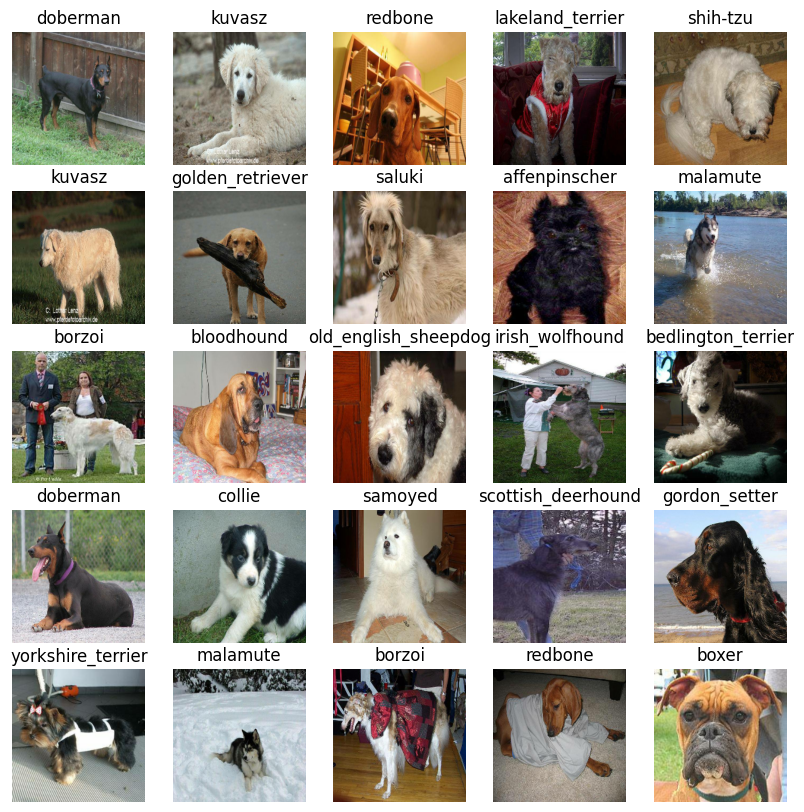

In [ ]:
# Now lets Visualize training images (data) from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

This is our training data. Notice they're all squares because we've resized them to 224 & 224.

**If we rerun the cell above, we would get a different set of images displayed each time we run it. It's b/c when we created the training batch, every time we call the training batch, it's going to shuffle the data.**

Now let's visualize our validation set.

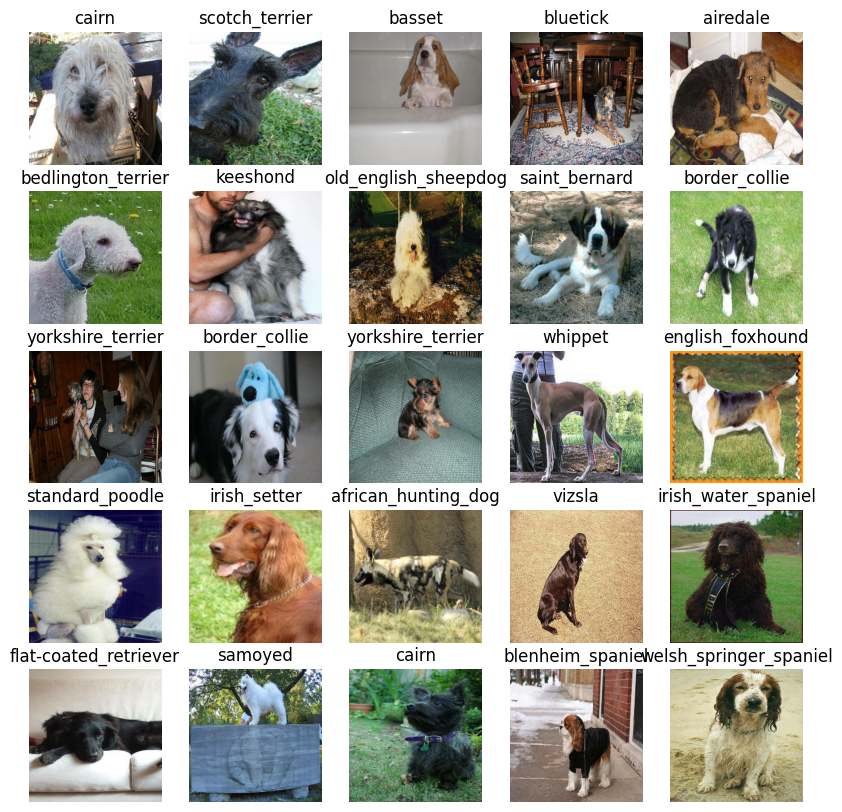

In [ ]:
# Now let's Visualize the validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

**Note that running the cell above &viewing validation images return the same dogs each time. This is b/c for our validation, when we created our validation batch, we don't shuffle the validation data.**

## Creating and training a model

Now our data is ready, let's prepare it modelling. We'll use an existing model from TensorFlow Hub.

**TensorFlow Hub is a resource where you can find pretrained machine learning models for the problem you're working on.** https://www.tensorflow.org/hub

Using a pretrained machine learning model is often referred to as **transfer learning**.

So rather than building a model from scratch, we're going to take what an existing model has already learned and apply it to our problem, which saves us on energy. Also, in terms of training, a model could take a long time costs because training a machine learning model isn't free. And then once we've found some baseline results, we can try and improve them from there.

### Building a model:

Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true

These 3 things (maybe not the URL, as you might build a model from scratch, but we're using a URL so that we can get started experimenting as quick as possible) will be standard practice with almost whatever machine learning model you use defining the inputs, defining the outputs, and defining the model.

And because we're using TensorFlow, everything will be in the form of tenses.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]   # batch, height, width, colour channels
                                    # here 'IMG_SIZE = 224'

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)    #here 'len(unique_breeds) = 120'

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true"

Now we've got the 3 criterias - i.e inputs, outputs and model- we're using ready to go. We have to work out how we can use them all together.

The next process is putting them together in the form of a function that's going to create a model for us and return it so that we can fit it to our data set.

There are many ways of building a model in TensorFlow but one of the best ways to get started is to use the Keras API. Details here: https://www.tensorflow.org/guide/keras.

Defining a deep learning model in Keras can be as straightforward as saying, "here are the layers of the model, the input shape and the output shape, let's go!"

*(The layers in a neural network means the different nodes)*

**Knowing this, let's create a function which:**

* Takes the input shape, output shape and the model we've chosen's URL as parameters.
* Defines the layers in a Keras model in a 'sequential' fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells it what kind of input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview.

In [ ]:
# Create a function which bulids a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building a model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL),     # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax")    # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),  # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(),   # A friend telling our model how to improve its guesses
      metrics=["accuracy"]   # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE)    # Let the model know what kind of inputs it'll be getting

  return model

**NOTE:** *THE ABOVE COE HAS BEEN EXPLAINED IN PARTS IN DETAIL BY DANIEL IN HIS VIDEO COURSE ON GITHUB/UDEMY.CHK TO UNDERSTAND OR RECALL!!!*

In [ ]:
# Create a model and check its details

model = create_model()
model.summary()

Building a model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating a Callback:

We've got a model ready to go but before we train it we'll make some callbacks.

**Callbacks are helper functions** a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to create are:
* **TensorBoard callback-** helps track our models progress. It's  like a dashboard for seeing how well your model is doing, seeing its progress, seeing that the loss function is getting reduced and that the accuracy is going up; and
* **Early Stopping callback-** prevents our model from training for too long and it's stopped improving before it over fits, we want it to stop training.

#### *TensorBoard Callback -*

TensorBoard helps provide a visual way to monitor the progress of your model during and after training. Details are here: https://www.tensorflow.org/tensorboard/get_started.

It can be used directly in a notebook to track the performance measures of a model such as loss and accuracy. https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks.

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize the our models training logs using the `%tensorboard` magic function (we'll do this later on).

Some details here: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard.



In [ ]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime    # to track each experiment that we run

# Create a function to build a TensorBoard call back
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

#### *Early Stopping Callback -*

Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."

Some more details here: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",   #though by default it monitors 'validation loss' but we'll use validation accuracy
                                                  patience=3)


### Training a model (on subset of data):

Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

We do this to make sure everything is working. And if it is, we can step it up later and train on the entire training dataset.

The final parameter we'll define before training is **`NUM_EPOCHS`** (also known as **number of epochs**).

`NUM_EPOCHS` defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.

If **`NUM_EPOCHS=1`**, the model will only look at the data once and will probably score badly because it hasn't a chance to correct itself. It would be like you competing in the international hill descent championships and your friend Adam only being able to give you 1 single instruction to get down the hill.


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

If **`NUM_EPOCHS`=1**, that means we're giving our model a single chance to look at all of the training data and then validating it from there.

If **`NUM_EPOCHS`=100**, then we're giving our model up to 100 chances to go through the training data set and figure out the patterns.

What's a good value for NUM_EPOCHS?

This one is hard to say. 10 could be a good start but so could 100. This is one of the reasons we created an early stopping callback. Having early stopping setup means if we set NUM_EPOCHS to 100 but if our model stops improving after 22 epochs, it'll stop training.


In [ ]:
# Let's check again if GPU is available (otherwise computing will take a long time)
print("GPU", "available (YEESSSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")


GPU available (YEESSSS!!!!!!)


Now that we've got a GPU running and `NUM_EPOCH` setup, let's create a simple function which trains a model.

The function will:

* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()` (we do this here so it creates a log directory of the current date and time).
* Call the `fit()` function on our model passing it the training data, validatation data, number of epochs to train (`NUM_EPOCHS`)for and the callbacks we'd like to use.
* Return the fitted model.

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model & returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()
    # every time we run 'train_model()' function,we're creating a logs folder which we can then track our model's performance.
    # this is real helpful when we're trying to evaluate which experiment did better than another.

  # Fit the model to the data, passing it the callbacks we created
  model.fit(x=train_data,      # it's a data batch which contains the images & labels
            epochs=NUM_EPOCHS,      # How many times is our model allowed to look at the training data before it stops
            validation_data=val_data,    # it's also a data batch
            validation_freq=1,    # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

**Note:** When training a model for the first time, the first epoch will take a while to load compared to the rest. This is because the model is getting ready and the data is being initialised. Using more data will generally take longer, which is why we've started with ~1000 images. After the first epoch, subsequent epochs should take a few seconds.

In [ ]:
# Fit the model to the data
model = train_model()

Building a model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true
Epoch 1/100
25/25 [==============================] - 134s 278ms/step - loss: 4.4428 - accuracy: 0.1025 - val_loss: 3.2068 - val_accuracy: 0.3200
Epoch 2/100
25/25 [==============================] - 6s 224ms/step - loss: 1.5803 - accuracy: 0.7025 - val_loss: 2.0789 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 4s 178ms/step - loss: 0.5502 - accuracy: 0.9337 - val_loss: 1.6391 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 6s 251ms/step - loss: 0.2545 - accuracy: 0.9850 - val_loss: 1.4521 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 5s 178ms/step - loss: 0.1455 - accuracy: 0.9975 - val_loss: 1.3757 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 4s 152ms/step - loss: 0.0992 - accuracy: 1.0000 - val_loss: 1.3408 - 

**NOTE:**

* It trained for 25 steps from epoch 1 to 100. So i.e 800/32 = 25, where 32 is the batch size & 800 is the training data set.
And validation is = 200/32 ~= 7, where 200 is the validation data set.

* We can see that the loss decreases & accuracy increses over time. So that means our model is training & finding patterns.It's using what 'mobile-net-v2' has learned in 'image net' and it's applying it to our dogs data set.

* We can also see that once the 'validation accuracy' stops improving for a number of epochs, b/c of our 'early stopping callback' in the function above, it stops training at epoch 10 out of 100.


So we can tell that **our model is overfitting** because it's performing way better on the training data (accuracy=1) than it is on the validation data (accuracy=0.6550). Also b/c our model is performing at 100% accuracy on our training data set with almost 0 loss!

That means---- our model has a poor ability to "generalize", i.e it has memorized the patterns too well on the training set but struggling to adapt to a data set it hasn't seen before a.k.a validation set.

#### Checking the TensorBoard logs:

Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier in the Drive folder and viualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

So these are the experiments we've run so far.

If we have a look at both of them just on the training data sets, they're basically following the same path. That's the loss is going down.

That's good. It means our model is learning something.

And if we follow the accuracy line..they're also following the same path here, which makes sense because we're using very similar data as we set a random state way back up when we when we split our data, we're actually using quite the same when we created our validation set.

So as both of these experiments are using the same sort of data, they get very similar results.

Also we can tell that our ML model is overfitting because it's learning the patterns in the training data far too well.

If we ran more experiments, as we keep using our create tensorflow callback, it's going to continually store logs in the logs folder.

So we've seen how we can evaluate our model's performance or at least initial performance on something like epoch accuracy and epoch loss and see how we can track different experiments.

But this is just on the models training and validation sets, and it's only really on what the model has learned in the data set. So our next step is to use our trained model to make some predictions.

## Making and evaluating predictions using a trained model

Before we scale up and train on more data, let's see some other ways we can evaluate our model.

Because although accuracy is a pretty good indicator of how our model is doing, it would be even better if we could could see it in action, i.e to evaluate what our model has learned is to use it for what we're building it for.

We always got to keep in mind what the end goal is...we're building dog vision to see if we can build a ML model that can identify a dog breed in a photo. So it's going to make some predictions giving a photo.

So let's do that.

Making predictions with a trained model is as calling `predict()` on it and passing it data in the same format the model was trained on.

In [ ]:
# 1st let's check our validation data
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

We've got some images and some labels in the Batch data set.

So when we pass this batch data set to `model.predict` (as below), because of the nature of the predict function, it's only going to look at the images in `val_data` and then make predictions based on those images. Then We can compare the model's predictions that it makes on the validation images to the actual labels from the validation images.

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go or the progress
predictions

7/7 [==============================] - 12s 175ms/step


array([[3.5692600e-04, 9.6951379e-05, 3.1240168e-04, ..., 4.5226258e-04,
        2.1707132e-05, 5.3745625e-04],
       [4.2329699e-04, 2.3396588e-04, 1.2523781e-02, ..., 9.4420109e-05,
        1.2167173e-03, 2.0059031e-04],
       [3.0696028e-06, 9.2025759e-05, 6.8160657e-06, ..., 2.7304908e-05,
        8.9950750e-05, 5.5358480e-05],
       ...,
       [6.7492979e-06, 9.1198144e-06, 5.1150500e-06, ..., 4.5170041e-06,
        2.7603310e-04, 1.2409975e-05],
       [6.8722712e-03, 1.2998366e-04, 1.3698277e-04, ..., 1.0463552e-03,
        7.3430259e-05, 3.8772898e-03],
       [1.5703618e-03, 2.0480360e-05, 5.9846765e-04, ..., 5.6665917e-03,
        3.4076028e-04, 3.9459464e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

Making predictions with our model returns an array with a different value for each label.

In this case, making predictions on the validation data (200 images) returns an array (predictions) of arrays, each containing 120 different values (one for each unique dog breed).

These different values are the probabilities or the likelihood the model has predicted a certain image being a certain breed of dog. The higher the value, the more likely the model thinks a given image is a specific breed of dog.

In [ ]:
# First prediction

index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[index])}") # b/c we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[index])}")  # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}") # the predicted label

[3.56926001e-04 9.69513785e-05 3.12401680e-04 1.36164408e-05
 8.18909248e-05 1.43519037e-05 2.33945474e-02 2.12185681e-04
 2.71864323e-04 4.31704248e-04 1.67955557e-04 5.32046724e-05
 2.94034893e-04 2.12919676e-05 1.26674844e-04 2.69668788e-04
 1.05975187e-05 5.27364433e-01 1.26592313e-05 5.69480981e-05
 9.06391142e-05 3.91580361e-05 1.30048229e-05 7.89106009e-04
 7.45516518e-05 1.48877327e-04 1.43030986e-01 3.04023415e-05
 2.51247286e-04 1.04964070e-04 2.41170455e-05 2.83995265e-04
 4.21195204e-04 1.56629230e-05 1.15157636e-04 2.28375252e-02
 1.18650814e-05 8.86519119e-05 1.99305287e-04 1.99957922e-05
 1.98780137e-04 1.48328945e-05 6.91051537e-05 3.16051119e-05
 7.35064805e-06 1.87588070e-04 7.81127346e-06 8.50358192e-05
 3.33572738e-04 3.83344450e-04 7.49531959e-04 2.73257701e-05
 2.14502768e-04 3.56530836e-05 2.81171142e-05 1.28909251e-05
 1.79998955e-04 2.80604837e-03 6.34535390e-05 5.97811006e-02
 1.66187019e-04 1.67825001e-05 5.83045359e-04 5.61853903e-06
 1.78509887e-04 1.191710

In [ ]:
# the above array is same as below:
predictions[0]

array([3.56926001e-04, 9.69513785e-05, 3.12401680e-04, 1.36164408e-05,
       8.18909248e-05, 1.43519037e-05, 2.33945474e-02, 2.12185681e-04,
       2.71864323e-04, 4.31704248e-04, 1.67955557e-04, 5.32046724e-05,
       2.94034893e-04, 2.12919676e-05, 1.26674844e-04, 2.69668788e-04,
       1.05975187e-05, 5.27364433e-01, 1.26592313e-05, 5.69480981e-05,
       9.06391142e-05, 3.91580361e-05, 1.30048229e-05, 7.89106009e-04,
       7.45516518e-05, 1.48877327e-04, 1.43030986e-01, 3.04023415e-05,
       2.51247286e-04, 1.04964070e-04, 2.41170455e-05, 2.83995265e-04,
       4.21195204e-04, 1.56629230e-05, 1.15157636e-04, 2.28375252e-02,
       1.18650814e-05, 8.86519119e-05, 1.99305287e-04, 1.99957922e-05,
       1.98780137e-04, 1.48328945e-05, 6.91051537e-05, 3.16051119e-05,
       7.35064805e-06, 1.87588070e-04, 7.81127346e-06, 8.50358192e-05,
       3.33572738e-04, 3.83344450e-04, 7.49531959e-04, 2.73257701e-05,
       2.14502768e-04, 3.56530836e-05, 2.81171142e-05, 1.28909251e-05,
      

In [ ]:
# And all our dog breeds are:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

**Summary from above output:**

For 'index 0' or for 'validation image 0', the predicted label is **Border Terrier**.

As we've used 'Softmax function' while building the model, so the max value, the probability of prediction, is 0.2309...but can be max up to 1. B/c for softmax function, the total is b/w 0 & 1 with highest single value can be 1. So this means we're predicting the highest label in here with a **21.6%** prediction probability. *The higher this value is to one, the closer it is to 1 i.e 100%, the more confident a model is about a certain prediction.*

And the sum of all of these values is **1**, again as per softmax function each component will be in the interval (0, 1) & the components withh add upto 1.

And the maximum index where this value occurs is **17**.

In [ ]:
# We can check for another example, lets say for 'index 42', then similarly
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.04017439e-04 2.44049643e-05 5.27446973e-05 3.55380143e-05
 1.06959790e-03 2.53224644e-05 7.58290334e-05 1.34379487e-03
 4.35612304e-03 1.66169703e-02 1.02284775e-05 6.99355314e-06
 5.22407645e-04 4.87750582e-03 9.44353582e-04 3.05172778e-03
 3.00317624e-05 3.44613160e-04 1.97340894e-04 2.35754065e-04
 2.32954444e-05 5.16053871e-04 2.36627002e-05 1.14944423e-05
 9.79076792e-03 3.55851516e-05 2.55364812e-05 2.77987983e-05
 9.42812549e-05 1.14208007e-04 6.45760374e-05 3.38648788e-05
 2.49041168e-05 1.21355033e-05 1.54717982e-05 1.00242250e-05
 4.18426789e-05 4.22722602e-04 1.75982968e-05 1.00207515e-01
 1.46488877e-04 8.48657419e-06 3.74659779e-03 4.07487096e-06
 9.28121226e-05 8.86580619e-06 1.87007958e-04 4.26901563e-04
 5.25900432e-05 1.30342858e-04 1.58107767e-04 6.94963601e-05
 1.84618737e-04 1.12566189e-03 1.16394658e-05 2.00238574e-04
 5.79492116e-05 3.14680365e-05 3.46899207e-04 1.23661466e-05
 2.28192184e-05 2.42313894e-04 4.38556617e-06 3.83444858e-05
 7.26659564e-05 4.610000

In this case, Max value (probability of prediction): 0.678...i.e around 67.85%. So that means its pretty confident with this one as its closer to 1 or 100%. And The maximum index is 113 and the predicted label is **Walkaround**.

In [ ]:
# We can cross chcek for the above breed of dog at index # 113
unique_breeds[113]

'walker_hound'

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!


**Note:** Prediction probabilities are also known as confidence levels.

So now we've got a kind of way to turn our predictions into something that we can understand.

What will start to do next is we'll create a bit of a function that's going to allow us to find the predicted labels for every sample in the validation set, i.e about 200 or so images.

And then we're going to *unbatch* the validation data set and compare the predictions in a visual way to the truth labels.

Let's first build a little function to convert prediction probabilities into predicted labels as well as help us to visualize the actual image that a model is making a prediction on and then compare it to that images actual label or the Truth label.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]  # just trying to concise the above long code into something simple

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

Remember, the model hasn't trained on the validation data, during the `fit()` function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels (truth labels).

Since our validation data `(val_data)` is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using `unbatch()`) and then turn it into an iterator using `as_numpy_iterator()`.

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Let's make a small function to do so.

In [ ]:
# Create a function to unbatch a bacth dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

**Let's make some functions to make these all a bit more visualize.**

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:

* Takes an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample 'n'
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Chnage the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


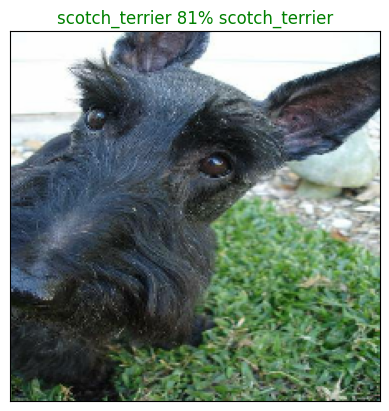

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

So that means the prediction is correct for 'index 1' i.e 'scotch terrier' as its 'green' and its 68% cofident that its a scotch terrier.

Let's try the same for another image, index 77.

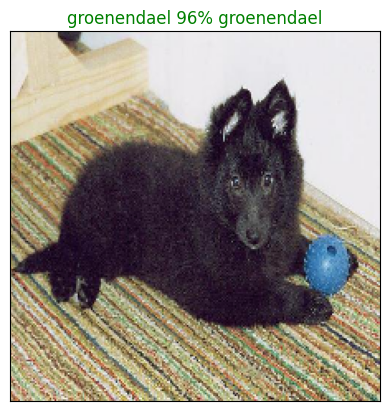

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

For this too it got it right with around 88% confidence level.

Let's try another, index 42.

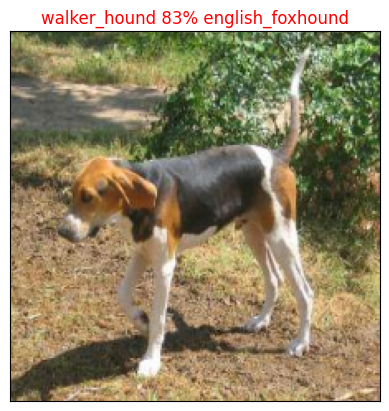

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Oh in this case it got it wrong, as the color is 'red'. So instead of predicting 'english foxhound', it predicted the image to be of a 'walker hound'  with 53% confidence level.

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:

* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using `get_pred_label()`.
* Find the top 10:
 * Prediction probabilities indexes
 * Prediction probabilities values
 * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top highest prediction confidences alongwith the truth label for sample 'n'.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction lables
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup a plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),        # these are the'x' values
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

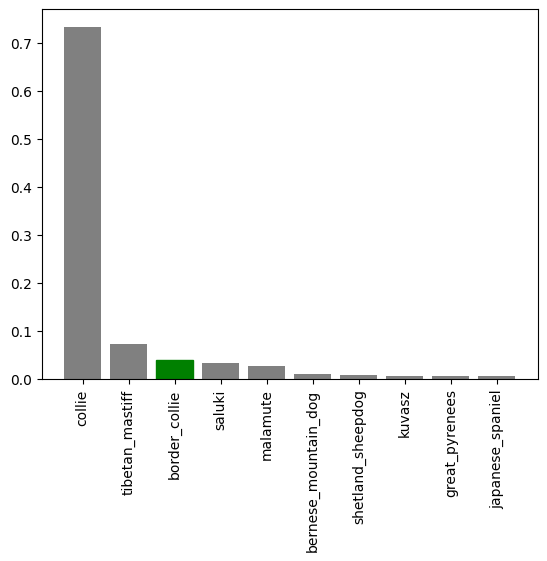

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

So along the bottom, i.e along X-ticks, are the **top 10** predictions that our model is made.

The highest predicted label with highest prediction value is the index 1, 'collie'. Rest all are the remaining top predcited values. We can see how they go down after the top value. And the true label is the one in green, i.e 'Border Collie'.

So what our model has done is predicted 'Collie' but the correct prediction is actually 'Border Collie'.

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few more predcitions and their different values!

We can combine both the above 2 visializations in 1.

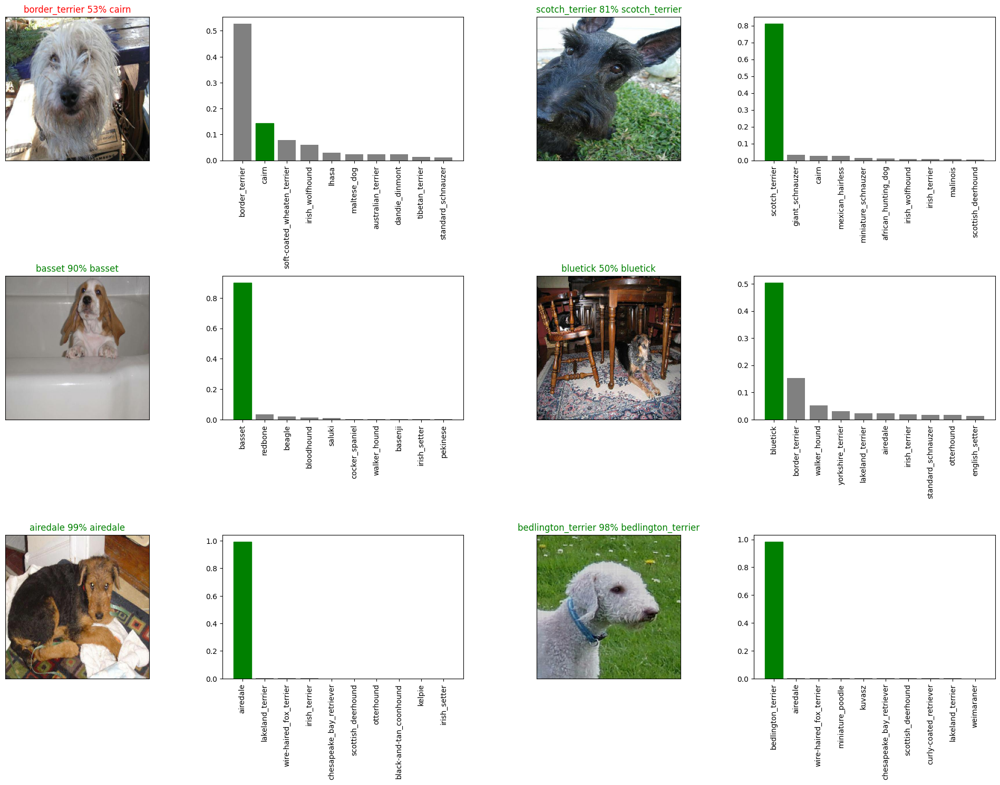

In [ ]:
# Let's check out a few predcitions and their different values

i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)  #for the images not to spreadout everywhere
plt.show()

We can change the 'i_multiplier' to 10, 20 or any other number to check the next set of images.

Now that we've visualized some of our predictions, let's figure out how to **save our trained model and load a trained model** in TensorFlow.

## Saving and Reloading a trained model

After training a model, it's a good idea to save it. Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it.



The format of an entire saved Keras model is h5. https://www.tensorflow.org/tutorials/keras/save_and_load.

**So we'll make a function which can take a model as input and utilise the `save()` method to save it as a h5 file to a specified directory.**

In [ ]:
# Create a function to save a model

def save_model(model, suffix=None):
  """
  Saves a given model in a model's directory and appends a sufficx (string) for clarity and reuse.
  """
  # Create a model directory pathname with current time
      #(we want to save our model with the current time so we can track our experiments. Giving it a little suffix so we know a bit about our model as We'd also like to know how many images was it trained on and stuff like that.)

  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"   # '.h5' (just like .jpeg,etc) is the extension/format in which it'll be saved
  print(f"Saving model to: {model_path}...")
  model.save(model_path)    #just like 'model.predict', 'model.save' saves the model to TensorFlow SavedModel or single h5 file.

  return model_path

**If we've got a saved model, we'd like to load it**, let's create a function which can take a model path and use the `tf.keras.models.load_model()` function to load it into the notebook.

Because we're using a component from TensorFlow Hub `(hub.KerasLayer)` we'll have to pass this as a parameter to the `custom_objects` parameter.

In [ ]:
# Create a function to save a model

def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
                                      # this tells to use a special layer from 'Tensorhub' which our model hasnt seen before, instead of using the tarditional Keras layers

  return model

**Now we've got functions to save and load a trained model, let's make sure they work!**

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")   #'suffix' here tells that our model will get trained on 1000 images


Saving model to: drive/MyDrive/Dog Vision/models/20240430-03071714446471-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240430-03071714446471-1000-images-mobilenetv2-Adam.h5'

As our trained model got saved (can cross check it in the folder), we can now load our trained model.

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20240420-05011713589305-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20240420-05011713589305-1000-images-mobilenetv2-Adam.h5


**Now let's Compare the two models (the original one and loaded one). We can do so easily using the `evaluate()` method.**

In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 145ms/step - loss: 1.2179 - accuracy: 0.6700


[1.2179100513458252, 0.6700000166893005]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 100ms/step - loss: 1.2741 - accuracy: 0.6800


[1.2741305828094482, 0.6800000071525574]

So we can see that both returned the same value!

## Training a 'big dog' model 🐶 (on the full data)

Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to `X` and all of the training labels to `y`. Let's check them out.

In [ ]:
# Remind ourselves of the size of the full dataset
len(X), len(y)

(10222, 10222)

Here, 'X' are the file names in train folder & 'y' are the labels. So we've got over 10,000 images and labels in our training set.

Before we can train a model on these, we'll have to turn them into a 'data batch'.

We can use our `create_data_batches()` function from above which also preprocesses our images for us (thank you past us for writing a helpful function!).

In [ ]:
# Create a data batch with the full data set (Turn full training data in a data batch)
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

`create_data_batches()' takes X & y and turns them into tensors. It shuffles them and then it maps our processing image function as well as get label function to the data. After that it turns the data into a batch size of 32.

Now Our data is in a data batch, all we need now is a model.

And we've already created a function earlier for that too!

Let's use `create_model()` to instantiate another model.

In [ ]:
# Create a model for full model (Instantiate a new model for training on the full dataset)
full_model = create_model()

Building a model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true


Since we've made a new model instance, "full_model", we'll need some callbacks too.

In [ ]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()   #helps us to track the performance of our model and compare it to others

# Early stopping callback
# Note: No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)
    # We're going to get it to monitor accuracy, so when our model is training on the full data, when its
      # accuracy stops going up for 3 epochs, we're going to get it to stop training so it doesn't overfit
      # or we're going to try & prevent it from overfitting too much.

Now this is just doing the exact same steps as what we've done, training a smaller model, but this time with more data.

**Note:**  Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

That is, the model has to train on all of the data (10,000+) images, it may take a fairly long time to get started and finish. However, thanks to our `full_model_early_stopping` callback, it'll stop before it starts going too long.

Remember, the 1st epoch is always the longest as data gets loaded into memory. After it's there, it'll speed up.

So before we run this, as long as every all the code is correct, actually it might error out.

That's why rather than trying on the full data from the beginning, we've made sure everything works.

Because when training a full machine learning model, a full deep learning model, it can take a fairly long time and hours.

In [ ]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,   # that's equal to 100 epochs
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 50s 140ms/step - loss: 1.3292 - accuracy: 0.6705
Epoch 2/100
320/320 [==============================] - 46s 145ms/step - loss: 0.4038 - accuracy: 0.8794
Epoch 3/100
320/320 [==============================] - 47s 147ms/step - loss: 0.2407 - accuracy: 0.9326
Epoch 4/100
320/320 [==============================] - 43s 135ms/step - loss: 0.1530 - accuracy: 0.9649
Epoch 5/100
320/320 [==============================] - 43s 133ms/step - loss: 0.1059 - accuracy: 0.9772
Epoch 6/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0770 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 44s 136ms/step - loss: 0.0584 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0460 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0374 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 43s 133m

### Saving and reloading the full model

Even on a GPU, our full model took a while to train. So it's a good idea to save it.

We can do so using our `save_model()` function.

In [ ]:
# Save model to file
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20240430-03281714447681-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20240430-03281714447681-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20240424-05581713938333-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20240424-05581713938333-full-image-set-mobilenetv2-Adam.h5


This is just a model training on the full training dataset aka 10000 images & labels. We aren't validating this. It's training on all the images in the trained file, a.k.a. X & y.

And so we can't really test on a validation set, but what we can do is import the test data set that we originally downloaded from Kaggle, turn them into a data bunch, and then use our model to make predictions and submit them to Kaggle.

### Making predictions on the test dataset

Now let's use our fully trained model to make some predictions on the test data set, which is also about 10,000 images.

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

And we already created function `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

**To make predictions on the test data, we'll:**

* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
    # 'os.listdir' here goes thru all of the file names in the folder and then
    # creates a list which appends the 'test path'or adds together the 'test path',
    # plus every single file name in the test folder.

test_filenames[:10]

['drive/MyDrive/Dog Vision/test/de9a61a532241cff14e732f43b646d9a.jpg',
 'drive/MyDrive/Dog Vision/test/e46f65254fdf01d5fe732068c844efbd.jpg',
 'drive/MyDrive/Dog Vision/test/e5e51d0dfc3ccdb74de51933b2671742.jpg',
 'drive/MyDrive/Dog Vision/test/e3cfadb2543190f43da6bb5500c75578.jpg',
 'drive/MyDrive/Dog Vision/test/e51de127ddf2c492372a63f0644b1a58.jpg',
 'drive/MyDrive/Dog Vision/test/e0a21cb0d8d3014b6c56230350a9362f.jpg',
 'drive/MyDrive/Dog Vision/test/e27567e188000db387977cdb9bbdcf82.jpg',
 'drive/MyDrive/Dog Vision/test/e2e9e37fa587ad87761da12e105c2b6b.jpg',
 'drive/MyDrive/Dog Vision/test/e49bfa1dc9bc6fa7464b29507725b3af.jpg',
 'drive/MyDrive/Dog Vision/test/dd8c716a81edb1cac3d4cb2b6c47880a.jpg']

Before we move to the next step, let's just do a little length check of our test file name, see how many images we have:

In [ ]:
# How many test images are there?
len(test_filenames)

10357

So now we've got the file names towards our test data, lets move to the next step, i.e convert the file names into test data batches.

In [ ]:
# Create test data bacth
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data bacthes...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

We can see that we've got our test data in the form of tensor batches.
There are no 'labels' in our test datasets, only images of 224 by 224 by 3 color channels of type TensorFlow float.


Now lets move on to the last step of making predictions...

**Note:**

*Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is b/c we've to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.*

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 262s 784ms/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
# Let's check out the test predictions (1st ten)
test_predictions[:10]

array([[2.12903478e-06, 3.09470266e-07, 3.69642095e-09, ...,
        5.71644563e-08, 3.51090677e-07, 2.10931805e-08],
       [5.00332419e-07, 2.45357581e-13, 3.11042893e-11, ...,
        2.04622985e-10, 9.27762031e-14, 4.39889636e-09],
       [3.71698436e-11, 5.94707833e-12, 1.86410765e-11, ...,
        1.25923655e-15, 1.14726707e-12, 8.04935437e-13],
       ...,
       [2.85247628e-14, 1.93920252e-15, 1.46299842e-13, ...,
        1.06509083e-12, 1.21533335e-15, 6.65298708e-13],
       [1.68460996e-08, 6.00889605e-09, 1.45444060e-10, ...,
        2.22999869e-10, 7.43206052e-10, 2.28913341e-05],
       [1.58718890e-13, 1.07006848e-10, 3.94923555e-14, ...,
        1.18252968e-11, 1.91655871e-12, 2.44964585e-13]])

So these are all prediction probabilities for the 10,000 images.

In [ ]:
# Let's have a look at the shape of test predictions
test_predictions.shape

(10357, 120)

**So we've 10357 test images and each one of them has 120 different prediction probabilities.**

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission (https://www.kaggle.com/c/dog-breed-identification/overview/evaluation), we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. That is, they want the models output probabilities each for label along with the image ID's.

**To get the data in this format, we'll:**

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the unique_breeds list and the test_predictions list.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Let's check the list of the 'unique breeds'
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [ ]:
["id"] + list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))  # creating an additional column 'id'
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


So we got 'id' and all of our unique breeds in order.

Let's move to the next step.

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path) for path in os.listdir(test_path)]

In [ ]:
test_path

'drive/MyDrive/Dog Vision/test/'

In [ ]:
test_ids

[('de9a61a532241cff14e732f43b646d9a', '.jpg'),
 ('e46f65254fdf01d5fe732068c844efbd', '.jpg'),
 ('e5e51d0dfc3ccdb74de51933b2671742', '.jpg'),
 ('e3cfadb2543190f43da6bb5500c75578', '.jpg'),
 ('e51de127ddf2c492372a63f0644b1a58', '.jpg'),
 ('e0a21cb0d8d3014b6c56230350a9362f', '.jpg'),
 ('e27567e188000db387977cdb9bbdcf82', '.jpg'),
 ('e2e9e37fa587ad87761da12e105c2b6b', '.jpg'),
 ('e49bfa1dc9bc6fa7464b29507725b3af', '.jpg'),
 ('dd8c716a81edb1cac3d4cb2b6c47880a', '.jpg'),
 ('e648a16d81b6441658b77bca0f1be4ee', '.jpg'),
 ('f14547a7bed40d4170bc70eafd1eb5e7', '.jpg'),
 ('ec6734fb75cab5100481b7b6e711d936', '.jpg'),
 ('f232ed4d2958c9b13ec8922933a852e4', '.jpg'),
 ('f37106dba00385993428e7c557b15805', '.jpg'),
 ('f00b35c8f1a052d4989f17134532efb4', '.jpg'),
 ('f3d2b254424ab99c267abc3ab22ba627', '.jpg'),
 ('ea280d6cb873df2eb683f0a5f13e3dce', '.jpg'),
 ('f33c435b1e92d5a639e6fc9463821595', '.jpg'),
 ('ec8bf9fd1bae9c6cc54b996425538a5c', '.jpg'),
 ('f532b476d5d46f4ba89b22449e3c147d', '.jpg'),
 ('eaacea894e

As we need only the 'id' nos. from the list above w/o the '.jpg' formats.

Let's append the above code by adding 'index 0' to it as we only want the 1st elemenst in each:

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path) [0] for path in os.listdir(test_path)]
test_ids

['de9a61a532241cff14e732f43b646d9a',
 'e46f65254fdf01d5fe732068c844efbd',
 'e5e51d0dfc3ccdb74de51933b2671742',
 'e3cfadb2543190f43da6bb5500c75578',
 'e51de127ddf2c492372a63f0644b1a58',
 'e0a21cb0d8d3014b6c56230350a9362f',
 'e27567e188000db387977cdb9bbdcf82',
 'e2e9e37fa587ad87761da12e105c2b6b',
 'e49bfa1dc9bc6fa7464b29507725b3af',
 'dd8c716a81edb1cac3d4cb2b6c47880a',
 'e648a16d81b6441658b77bca0f1be4ee',
 'f14547a7bed40d4170bc70eafd1eb5e7',
 'ec6734fb75cab5100481b7b6e711d936',
 'f232ed4d2958c9b13ec8922933a852e4',
 'f37106dba00385993428e7c557b15805',
 'f00b35c8f1a052d4989f17134532efb4',
 'f3d2b254424ab99c267abc3ab22ba627',
 'ea280d6cb873df2eb683f0a5f13e3dce',
 'f33c435b1e92d5a639e6fc9463821595',
 'ec8bf9fd1bae9c6cc54b996425538a5c',
 'f532b476d5d46f4ba89b22449e3c147d',
 'eaacea894e9bdda125ae215081a0d9fc',
 'f285b753c96949769c745ec0f90b2253',
 'ef59760870674327ca5d004bae427422',
 'f5787e3574a4af6a19ff825cf0c32366',
 'f3a99ce58c3efc75fe2377be02c545f9',
 'f1af835a9146d6ec0da8059b3a55c030',
 

In [ ]:
preds_df["id"] = test_ids

In [ ]:
# Let's check out the heads of preds_df, i.e 1st 5 rows
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de9a61a532241cff14e732f43b646d9a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e46f65254fdf01d5fe732068c844efbd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e5e51d0dfc3ccdb74de51933b2671742,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e3cfadb2543190f43da6bb5500c75578,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e51de127ddf2c492372a63f0644b1a58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


So we got our IDs there, now we need to just append all of our prediction probabilities for each dog breed.



In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
   #this is going to access 'preds_df' of all of the unique breeds, i.e all of the breeds columns.
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de9a61a532241cff14e732f43b646d9a,2.129035e-06,3.094703e-07,3.696421e-09,3.621859e-06,1.628492e-10,1.122133e-10,2.258705e-06,8.496642e-09,4.140201e-11,...,6.302749e-09,1.524946e-08,1.123565e-08,4.478385e-07,2.998674e-10,6.777228e-09,4.578349e-10,5.716446e-08,3.510907e-07,2.109318e-08
1,e46f65254fdf01d5fe732068c844efbd,5.003324e-07,2.453576e-13,3.110429e-11,5.667638e-11,4.119258e-11,4.058108e-12,6.090038e-12,1.137139e-09,2.344153e-10,...,3.995495e-10,5.947090e-12,7.135967e-11,8.066839e-11,3.190786e-08,1.195140e-11,3.353429e-13,2.046230e-10,9.277620e-14,4.398896e-09
2,e5e51d0dfc3ccdb74de51933b2671742,3.716984e-11,5.947078e-12,1.864108e-11,9.349601e-10,2.101421e-14,3.404242e-14,1.782022e-10,1.440505e-13,8.738493e-13,...,6.160687e-11,1.408403e-13,1.168138e-11,4.506965e-14,4.072985e-14,1.189521e-11,4.107324e-15,1.259237e-15,1.147267e-12,8.049354e-13
3,e3cfadb2543190f43da6bb5500c75578,6.490572e-06,1.150786e-12,4.174610e-09,9.510503e-09,6.980590e-09,1.118626e-14,6.913423e-04,7.506384e-09,1.932222e-11,...,4.426077e-09,9.151162e-05,9.469260e-11,1.143699e-11,2.649464e-12,5.837501e-12,4.728877e-06,9.875725e-10,6.883488e-10,5.693001e-04
4,e51de127ddf2c492372a63f0644b1a58,1.024123e-12,1.436511e-10,4.300989e-10,1.236007e-09,1.937977e-07,1.022991e-08,1.664685e-10,9.148138e-14,2.645381e-13,...,7.630981e-11,1.516264e-11,1.047590e-08,5.772551e-11,4.518540e-01,8.284078e-15,4.604092e-13,1.707671e-06,3.028353e-10,1.293722e-12


Let's now export our predictions DataFrame to CSV so we can submit it to Kaggle.

In [ ]:
# Save our predictions DataFrame to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
               index=False)    # as we dont want index so that would be 'false'

## Making predictions on custom images

It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

So, to make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using 'create_data_batches()'. And since our custom images won't have labels, we set the 'test_dat' parameter to 'True'.
* Pass the custom image data batch to our model's 'predict()' method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/images.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/Golden+Retrievers+dans+pet+care.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/gettyimages-464163411.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/happy-dog-outdoors-royalty-free-image-1652927740.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/golder-retriever-puppy.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/small-dog-owners.jpg']

In [ ]:
# Turn custom images into batch datasets (set to test data as there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data bacthes...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Now that our custom images are in tenses so we can make predictions on the custom data.

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds

array([[1.96104813e-10, 4.05342204e-09, 9.69831504e-09, 7.57549717e-11,
        6.13214934e-06, 1.59357603e-06, 5.37178870e-08, 1.15268568e-08,
        6.79599302e-12, 1.36134690e-06, 5.52554358e-09, 2.06818330e-11,
        1.92515675e-08, 6.50413160e-04, 5.67263510e-12, 1.76514391e-07,
        7.83513462e-11, 4.68279140e-05, 2.90320287e-07, 6.66501077e-10,
        5.27744948e-13, 4.02325430e-11, 7.17844761e-09, 3.70102893e-10,
        1.95335451e-04, 2.74430761e-07, 5.29523945e-08, 2.81388974e-08,
        4.36308546e-05, 2.19234935e-05, 1.35620959e-09, 1.14283296e-07,
        2.29636171e-07, 2.23864016e-09, 4.27804459e-08, 2.32603907e-06,
        2.50849227e-13, 6.77739462e-11, 4.30706200e-11, 1.31827360e-03,
        1.27096183e-03, 5.00053865e-08, 2.33839632e-08, 1.33550182e-09,
        4.98207752e-04, 8.82495577e-10, 1.47967832e-10, 2.42096644e-06,
        5.15537524e-09, 2.57657856e-01, 3.25957181e-08, 5.53956492e-10,
        1.09532721e-06, 3.73409593e-12, 9.53608395e-14, 6.650663

In [ ]:
custom_preds.shape

(6, 120)

So we've 6 images & 120 predictions for each one.

Now that we've got some predictions arrays, let's convert them to labels and then compare the labels with each image.

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever',
 'golden_retriever',
 'eskimo_dog',
 'border_collie',
 'golden_retriever',
 'yorkshire_terrier']

So now we need to get the custom images, a.k.a. 'unbatchify', but our 'unbatchify()' function won't work since there aren't labels.

This is something we can improve later on,probably improve our own batch of function later on.

For now we'll use 'unbatch()' function which will unwind our data batch into just images and into something that we can iterate over because we're using `as_numpy_iterator`.

In [ ]:
#  Get custom images (our 'unbatchify()' function won't work since there aren't labels... maybe we could fix this later)
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

  # We've got an empty list where on batching our batch custom data set, we're turning it into an iterator
  # and we're appending each image to custom images.

Now lets check custom image predictions.

Lets plot it up.

We want to plot it up like we've done before right up here. But because we don't have labels, we can't really use our function used previously above.

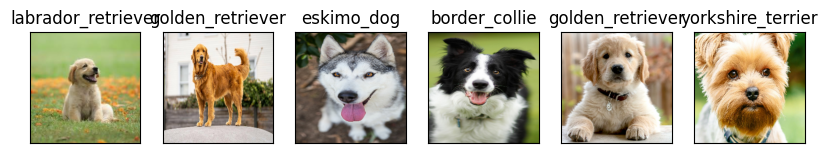

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):   # 'enumerate' is going to go for the images in 'custom_images',count them up,save the count of it to 'i'&save the image inside 'custom_images' to 'image'
  plt.subplot(1, 6, i+1)  # 1 row, 3 columns & index of our subplot
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

### In Summary:

In this notebook, we've built an end to end multiclass image classifier using TensorFlow 2.0 and TensorFlow Hub, where ----------

* We defined our problem.

* We defined our data from Kaggle.

* We've defined our evaluation.

* We've gone through a bunch of different features.

* We've got our workspace ready using TensorFlow two and a GPU.

* We've got our data ready, turning it into tenses.

* We've seen how many different dog breed images there are.

* We've got the images in the labels.

And if we look into the TensorFlow Workflow, then also -----

* We've got our data ready.

* We turn it into tenses.

* We've picked a model to suit our problem image classification using TensorFlow hub a.k.a a neural network,a deep learning neural network.

* We fit the model to the data.

* We've made predictions.

* We've evaluated our model.

* By visualizing our predictions, we've improved through experimentation, by trying out a model to make sure that it works on a 1000 images first before scaling up. Of course, there are some more improvements that we can do.

* And we've seen how to save and reload our trained models.

**Note:**

Can go thru the link below where Daniel has for more ideas & options to improve the project.

https://www.udemy.com/course/complete-machine-learning-and-data-science-zero-to-mastery/learn/lecture/17949958#overview